In [1]:
using Pkg

#Pkg.add("FFTW")

using Plots
using Random
using Statistics
using LinearAlgebra
using FFTW
using DSP


In [2]:
function bandlimnoise(cutoff, tsamp, tmax)
    # Generate band-limited noise with a cutoff frequency
    nt = round(Int, tmax / tsamp) + 1
    z = floor(Int, log2(nt - 0.01))
    nt = 2^z
    x = randn(nt)
    xf = fft(x)
    df = 1.0 / (tsamp * 2^z)
    j1 = 1
    j2 = round(Int, cutoff / df) + 1
    nn = length(xf)
    xf[1:j1-1] .= 0
    xf[j2+1:nn] .= 0
    stim = real(ifft(xf))
    stim .-= mean(stim)
    stim ./= std(stim)
    return stim, nt
end

function conv_same(u::Vector{Float64}, v::Vector{Float64})
    y = conv(u, v)
    n = length(u)
    start = cld(length(y) - n + 1, 2)
    return y[start:start+n-1]
end


conv_same (generic function with 1 method)

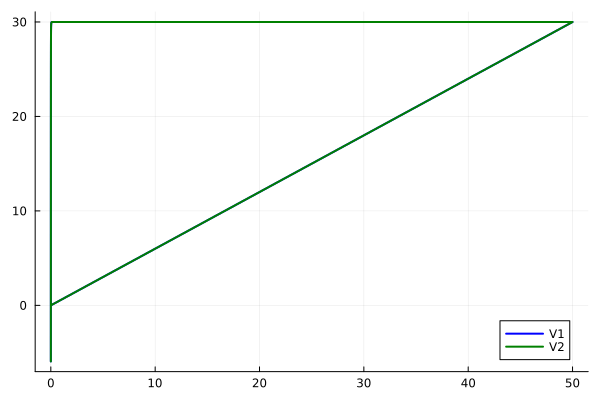

In [3]:
# === Parameters ===
tmax = 50.0                   # seconds
tf = tmax * 1000              # milliseconds
step = 0.1                    # ms
tsamp = 2.0                   # sampling rate in ms
cutoff = 16.0                 # Hz
noise = 0.0

# Synaptic parameters
alpha1, beta1 = 0.02, 0.001
scale1 = alpha1 / (alpha1 + beta1)

alpha2, beta2 = 0.013, 0.001
scale2 = alpha2 / (alpha2 + beta2)

gelec = 0.0001

# variables to try:
# g12, g21 = 0.0, 0.0
# g12, g21 = 0.005, 0.0
# g12, g21 = 0.04, 0.09
# g12, g21 = 0.02, 0.08



g12, g21 = 0.04, 0.09

# Calcium parameters
Ca_shift1, Ca_shift2 = -50.0, -20.0
x_shift = -4.0

# H-current
gh = 0.0
Vhh = -55.0

# Current injection time window
t1, t2 = 0.0, 0.0

# Initial conditions
V1, V2 = -44.0, -44.0
Ca1, Ca2 = 0.6, 1.3
h1, h2 = 0.0, 0.0
n1, n2 = 0.0, 0.0
x1, x2 = 0.8, 0.92
y1, y2 = 0.0, 0.0
s1, s2 = 0.0, 0.0

# Derived variables
cut1 = cutoff / 1000
nt = Int(round(tf / step))
nt1 = Int(round(tmax * 1000 / tsamp)) + 1
is = Int(round(tsamp / step))

# Heaviside stimulus window
heav = zeros(Float64, nt)
j1 = Int(round(t1 / step)) + 1
j2 = Int(round(t2 / step)) + 1
heav[j1:end] .= 1.0
heav[j2:end] .-= 1.0

# Noise (optional band-limited noise generator)
rnd1 = zeros(nt)  # Placeholder; you can use actual bandlimnoise function
rnd2 = zeros(nt)
rnd1 .*= noise
rnd2 .*= noise

# Time series storage
time = zeros(nt1)
vv1 = similar(time)
vv2 = similar(time)
ss1 = similar(time)
ss2 = similar(time)
Caa1 = similar(time)
Caa2 = similar(time)
xx1 = similar(time)
xx2 = similar(time)
heavy = similar(time)

# Voltage scaling helper
Vscaled(V) = (127 * V) / 105 + 8265 / 105

# === Main Simulation Loop ===
j = 0
for i in 1:nt
    tt = (i - 1) * step
    V1s = Vscaled(V1)
    V2s = Vscaled(V2)

    # Update V1
    V1 += step * (4*((0.1*(50 - (127*V1/105 + 8265/105)))/exp((50 - (127*V1/105 + 8265/105))/10) - 1)/
        ((0.1*(50 - (127*V1/105 + 8265/105)))/exp((50 - (127*V1/105 + 8265/105))/10) - 1) 
        + 4 * exp((25 - (127*V1/105 + 8265/105))/18))^3 * h1 * (30 - V1)
        + 0.3 * n1^4 * (-75 - V1)
        + 0.01 * x1 * (30 - V1)
        + 0.03 * Ca1 / (0.5 + Ca1) * (-75 - V1)
        + 0.003 * (-40 - V1)
        + gh * (1 / (1 + exp(-(V1 + 63) / 7.8)))^3 * y1 * (120 - V1)
        - g21 * (V1 + 80) * s2 / scale1
        + gelec * (V2 - V1)
        + rnd1[i]
    
    # Update V2
    V2 += step * (
        4*((0.1*(50 - (127*V2/105 + 8265/105)))/exp((50 - (127*V2/105 + 8265/105))/10) - 1)/
        ((0.1*(50 - (127*V2/105 + 8265/105)))/exp((50 - (127*V2/105 + 8265/105))/10) - 1) 
        + 4 * exp((25 - (127*V2/105 + 8265/105))/18))^3 * h2 * (30 - V2)
        + 0.3 * n2^4 * (-75 - V2)
        + 0.01 * x2 * (30 - V2)
        + 0.03 * Ca2 / (0.5 + Ca2) * (-75 - V2)
        + 0.003 * (-40 - V2)
        + gh * (1 / (1 + exp(-(V2 + 63) / 7.8)))^3 * y2 * (120 - V2)
        - g12 * (V2 + 80) * s1 / scale2
        + gelec * (V1 - V2)
        + rnd2[i]

    # Update calcium dynamics
    Ca1 += step * (0.0003 * (0.0085 * x1 * (140 - V1 + Ca_shift1) - Ca1))
    Ca2 += step * (0.0003 * (0.0085 * x2 * (140 - V2 + Ca_shift2) - Ca2))

    # Update x
    x1 += step * ((1 / (exp(0.15 * (-V1 - 50 + x_shift)) + 1) - x1) / 100)
    x2 += step * ((1 / (exp(0.15 * (-V2 - 50 + x_shift)) + 1) - x2) / 100)

    # Update h
    h1 += step * (((1 - h1) * 0.07 * exp((25 - V1s) / 20)) - h1 / (1 + exp((55 - V1s) / 10))) / 12.5
    h2 += step * (((1 - h2) * 0.07 * exp((25 - V2s) / 20)) - h2 / (1 + exp((55 - V2s) / 10))) / 12.5

    # Update n
    n1 += step * (((1 - n1) * 0.01 * (55 - V1s) / (exp((55 - V1s) / 10) - 1)) - n1 * 0.125 * exp((45 - V1s) / 80)) / 12.5
    n2 += step * (((1 - n2) * 0.01 * (55 - V2s) / (exp((55 - V2s) / 10) - 1)) - n2 * 0.125 * exp((45 - V2s) / 80)) / 12.5

    # Update y
    y1 += step * (0.5 * ((1 / (1 + exp(10 * (V1 - Vhh)))) - y1) / (7.1 + 10.4 / (1 + exp((V1 + 68) / 2.2))))
    y2 += step * (0.5 * ((1 / (1 + exp(10 * (V2 - Vhh)))) - y2) / (7.1 + 10.4 / (1 + exp((V2 + 68) / 2.2))))

    # Update synaptic gating
    s1 += step * (alpha1 * s1 * (1 - s1) / (1 + exp(-20 * (V1 + 20))) - beta1 * (s1 - 0.0001))
    s2 += step * (alpha2 * s2 * (1 - s2) / (1 + exp(-20 * (V2 + 20))) - beta2 * (s2 - 0.0001))

    # Save sampled data
    if mod(i, is) == 0
        j += 1
        time[j] = tt
        vv1[j] = V1
        vv2[j] = V2
        ss1[j] = s1
        ss2[j] = s2
        Caa1[j] = Ca1
        Caa2[j] = Ca2
        xx1[j] = x1
        xx2[j] = x2
        heavy[j] = heav[i]
    end
end

# Convert time to seconds
time ./= 1000

# Plot
plot(time, vv1, label="V1", lw=2, color=:blue)
plot!(time, vv2, label="V2", lw=2, color=:green)

  0.970659 seconds (52.23 M allocations: 801.465 MiB, 6.35% gc time, 1.55% compilation time)


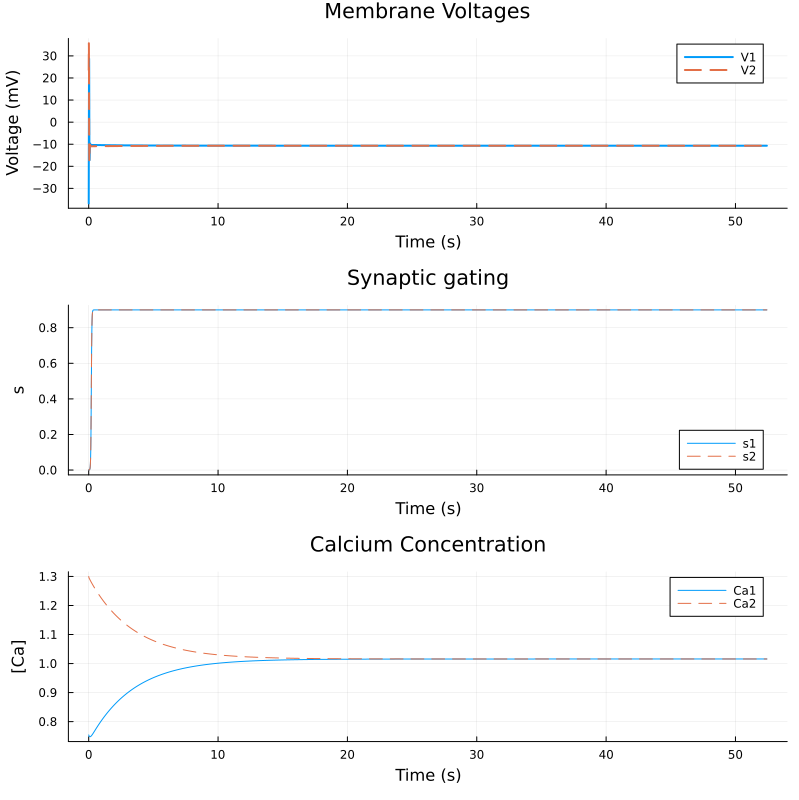

In [9]:
# Parameters
tmax = 100.0        # seconds (reduced for testing)
alpha = 0.05
beta = 0.005
gelec = 0.0 # nonzero electrical coupling


g12 = 0.0         # synaptic coupling
g21 = 0.0

# other parameters to try:
# g12, g21 = 0.01, 0
# g12, g21 = 0.02, 0.02
# g12, g21 = 0.03, 0.03


cutoff = 15.0     # Hz
noise = 0.0       # drive system
Ca_shift = -31
x_shift = -4
Iapp = 0.655        # add input current

t1 = 0.0 * 1000  # ms
t2 = 0.0 * 1000  # ms

gh = 0.0
Vhh = -50.0

tf = tmax * 1000  # ms
step = 0.2        # ms
tsamp = 2.0       # ms
cut1 = cutoff / 1000

# Initial conditions

# Ca1 to try:
# Ca1 = 0.6824
# Ca1 = 0.68239
# Ca1 = 0.754299099965405
# Ca1 = 0.3

Ca1 = 0.3


Ca2 = 1.3

V1 = -44.0
V2 = 20.0
h1 = h2 = 0.0
n1 = n2 = 0.0
x1 = 0.3
x2 = 0.94
y1 = y2 = 0.0
s1 = s2 = 0.0
m1 = m2 = 0.0

# Time setup
nt = Int(tf / step)
nt1 = Int(round(tmax * 1000 / tsamp)) + 1
isave = Int(round(tsamp / step))

# Bandlimited noise (Gaussian white for now)
rnd1_raw, nt_noise = bandlimnoise(cut1, step, tf)
rnd2_raw, _        = bandlimnoise(cut1, step, tf)
rnd1 = rnd1_raw .* noise
rnd2 = rnd2_raw .* noise
nt   = nt_noise

# Data storage
time = zeros(Float64, nt1)
vv1 = similar(time)
vv2 = similar(time)
ss1 = similar(time)
ss2 = similar(time)
Caa1 = similar(time)
Caa2 = similar(time)
xx1 = similar(time)
xx2 = similar(time)
heavy = similar(time)

# Precalculate heaviside
heav = zeros(Float64, nt)
j1 = Int(round(t1 / step)) + 1
j2 = Int(round(t2 / step)) + 1
heav[j1:end] .= 1
heav[j2:end] .-= 1

j = 0

@time for i in 1:nt
    tt = (i - 1) * step

    function Vs(V)
        return 127 * V / 105 + 8265 / 105
    end

    V1s = Vs(V1)
    V2s = Vs(V2)

    function calc_dV(V, h, n, x, Ca, y, s, V_other, gsyn, rnd, g_other, s_other)
        m_inf = (
            0.1*(50-(127*V/105 + 8265/105)) / exp((50-(127*V/105 + 8265/105))/10) - 1
        )

        return step * (
            4 * m_inf / ((0.1*(50 - (127*V/105 + 8265/105)) / exp((50 - (127*V/105 + 8265/105))/10) - 1))
        
        + 0.3*n^4*(-75 - V)
        + 0.01*x*(30 - V)
        + 0.03*Ca/(0.5 + Ca)*(-75 - V)
        + 0.003*(-40 - V)
        + gh*(1/(1 + exp(-(V + 63)/7.8)))^3*y*(120 - V)
        - gsyn*(V + 80)*s
        + gelec*(V_other - V)
        + rnd)
    end

    V1 += calc_dV(V1, h1, n1, x1, Ca1, y1, s1, V2, g21, rnd1[i], g21, s2)
    V2 += calc_dV(V2, h2, n2, x2, Ca2, y2, s2, V1, g12, rnd2[i], g12, s1)

    Ca1 += step * (0.0003 * (0.0085 * x1 * (140 - V1 + Ca_shift) - Ca1))
    Ca2 += step * (0.0003 * (0.0085 * x2 * (140 - V2 + Ca_shift) - Ca2))

    x1 += step * ((1 / (exp(0.15 * (-V1 - 50 + x_shift)) + 1) - x1) / 100)
    x2 += step * ((1 / (exp(0.15 * (-V2 - 50 + x_shift)) + 1) - x2) / 100)

    h1 += step * ((1 - h1) * (0.07 * exp((25 - V1s) / 20)) - h1 * (1.0 / (1 + exp((55 - V1s) / 10)))) / 12.5
    h2 += step * ((1 - h2) * (0.07 * exp((25 - V2s) / 20)) - h2 * (1.0 / (1 + exp((55 - V2s) / 10)))) / 12.5

    n1 += step * (((1 - n1) * 0.01 * (55 - V1s) / (exp((55 - V1s) / 10) - 1) - n1 * 0.125 * exp((45 - V1s) / 80)) / 12.5)
    n2 += step * (((1 - n2) * 0.01 * (55 - V2s) / (exp((55 - V2s) / 10) - 1) - n2 * 0.125 * exp((45 - V2s) / 80)) / 12.5)

    y1 += step * (0.5 * ((1 / (1 + exp(10 * (V1 - Vhh)))) - y1) / (7.1 + 10.4 / (1 + exp((V1 + 68) / 2.2))))
    y2 += step * (0.5 * ((1 / (1 + exp(10 * (V2 - Vhh)))) - y2) / (7.1 + 10.4 / (1 + exp((V2 + 68) / 2.2))))

    s1 += step * (alpha * s1 * (1 - s1) / (1 + exp(-10 * (V1 + 20))) - beta * (s1 - 0.001))
    s2 += step * (alpha * s2 * (1 - s2) / (1 + exp(-10 * (V2 + 20))) - beta * (s2 - 0.001))

    if mod(i, isave) == 0
        j += 1
        time[j] = tt
        vv1[j] = V1
        vv2[j] = V2
        ss1[j] = s1
        ss2[j] = s2
        Caa1[j] = Ca1
        Caa2[j] = Ca2
        xx1[j] = x1
        xx2[j] = x2
        heavy[j] = heav[i]
    end
end

time ./= 1000  # convert to seconds

# Plotting
p1 = plot(time[1:j], vv1[1:j], label = "V1", lw = 2, xlabel = "Time (s)", ylabel = "Voltage (mV)", title = "Membrane Voltages")
plot!(p1, time[1:j], vv2[1:j], label = "V2", lw = 2, linestyle = :dash)

p2 = plot(time[1:j], ss1[1:j], label = "s1", xlabel = "Time (s)", ylabel = "s", title = "Synaptic gating")
plot!(p2, time[1:j], ss2[1:j], label = "s2", linestyle = :dash)

p3 = plot(time[1:j], Caa1[1:j], label = "Ca1", xlabel = "Time (s)", ylabel = "[Ca]", title = "Calcium Concentration")
plot!(p3, time[1:j], Caa2[1:j], label = "Ca2", linestyle = :dash)

plot(p1, p2, p3, layout = (3, 1), size = (800, 800))


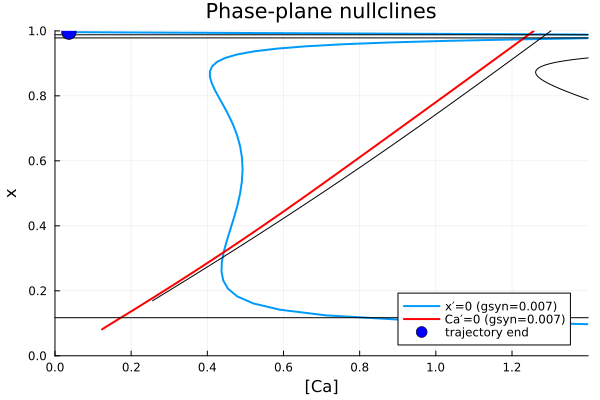

In [5]:
# ——— Parameters ———
dca    = -30.0
dx     =  -4.0
gsyn1  =  0.007    # colored nullclines  
gsyn2  =  0.0      # black nullclines  
Iapp   =  0.0
VI, VK =  30.0, -75.0
VL     = -30.0
gT     =  0.01
gL     =  gL = 0.003
gKCa   =  0.03
gK     =  0.3
gI     =  4.0
gh     =  0.0
Vhh    = -50.0

# helper to compute nullclines for a given gsyn
function compute_nullclines(V, gsyn)
    # x-nullcline: x = 1/(1+exp(-0.15*(V+50-dx)))
    x_nc = 1 ./(1 .+ exp.(-0.15 .* (V .+ 50 .- dx)))
    # steady-state gating for m, h, n, y
    Vs  = 127 .* V ./ (VI .- VK) .- (115*VK + VI*12)/(VI-VK)
    amm = 0.1 .* (50 .- Vs) ./ (exp.((50 .- Vs)/10) .- 1)
    bmm = 4   .* exp.((25 .- Vs)/18)
    minf = amm ./ (amm .+ bmm)
    ah  = 0.07 .* exp.((25 .- Vs)/20)
    bh  = 1   ./(1 .+ exp.((55 .- Vs)/10))
    hinf = ah ./ (ah .+ bh)
    an  = 0.01 .* (55 .- Vs) ./ (exp.((55 .- Vs)/10) .- 1)
    bn  = 0.125 .* exp.((45 .- Vs)/80)
    ninf = an ./ (an .+ bn)
    yinf = 1 ./(1 .+ exp.(10 .* (V .- Vhh)))
    # build Ca1 for the Ca‑nullcline
    Ca1 = 0.0085 .* x_nc .* (140 .- V .+ dca)
    # currents
    Ittx  = gT .* x_nc .* (V .- VI)
    Ileak = gL .* (V .- VL)
    IK    = gK .* (ninf .^ 4) .* (V .- VK)
    INa   = -gI .* (minf .^ 3) .* hinf .* (30 .- V)
    Ihh   = gh .* (1 ./(1 .+ exp.(-(V .+ 63)/7.8))).^3 .* yinf .* (V .- 70)
    # total dV/dt RHS
    Q1 = -gsyn .* (V .+ 80) .- Iapp .- INa .- IK .- Ittx .- Ileak .- Ihh
    Ca2_nc = 0.5 .* Q1 ./ (0.03 .* (V .- VK) .- Q1)
    # alternative Ca‑nullcline via Ca′=0 from the other rearranged eqn:
    Q2 = -gsyn .* (V .+ 80) .- Iapp .+ gI .* (minf.^3 .* hinf) .* (VI .- V) .+
         gK .* (ninf.^4) .* (VK .- V) .+ 0.03 .* Ca1 .* (V .+ 75) ./ (0.5 .+ Ca1) .-
         gL .* (V .- VL) .- Ihh
    x_nc2 = Q2 ./ (gT .* (VI .- V))
    Ca3_nc  = 0.0085 .* x_nc2 .* (140 .- V .+ dca)
    return x_nc, Ca2_nc, x_nc2, Ca3_nc
end

# V sweep
V_range1 = -69.0:1.0:-17.0
V_range2 = -68.0:0.1:-22.0

# compute for gsyn1
x1, Ca2_1, x2, Ca3_1 = compute_nullclines(V_range1, gsyn1)
# compute for gsyn2
x1b, Ca2_2, x2b, Ca3_2 = compute_nullclines(V_range2, gsyn2)

# ——— Plot ———
plt = plot(
    Ca2_1, x1, 
    label = "x′=0 (gsyn=$gsyn1)", lw=2, 
    xlabel = "[Ca]", ylabel = "x",
    xlim = (0,1.4), ylim = (0,1),
)
plot!(plt, Ca3_1, x2, color = :red, label = "Ca′=0 (gsyn=$gsyn1)", lw=2)

# black nullclines for gsyn2
plot!(plt, Ca2_2, x1b, color = :black, lw=1, label = "")
plot!(plt, Ca3_2, x2b, color = :black, lw=1, label = "")

# add the end‑point dots (optional)
scatter!(plt, [Ca2_1[end], Ca2_2[end]], [x1[end], x1b[end]],
         markersize=8, markercolor=[:blue :black], label="trajectory end")

title!(plt, "Phase‑plane nullclines")


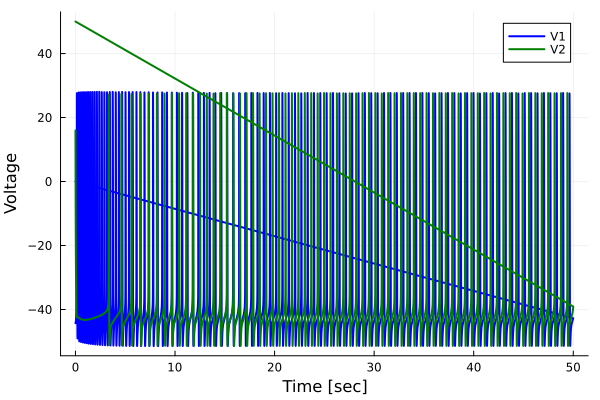

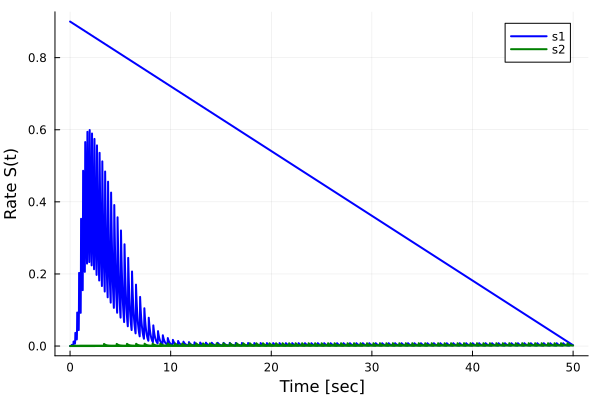

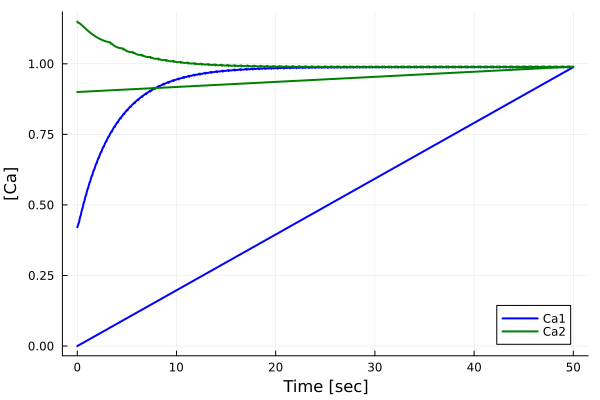

In [6]:
# Parameters
tmax = 50.0          # max time in seconds
alpha = 0.05
beta = 0.0051
gelec = 0.0

# Coupling
g12 = 0.0
g21 = 0.0

# Cutoff and noise
cutoff = 10.0        # Hz
noise = 0.0

# Calcium dynamics
Ca_shift = -40.0
x_shift = -4.0

# Constant stimulus
Iapp = 0.0

# Stimulus timing (ms)
t1 = 0.0
t2 = 0.0

# H-current
gh = 0.0
Vhh = -50.0

# Integration
tf = tmax * 1000      # ms
step = 0.2            # ms
tsamp = 2.0           # ms

cut1 = cutoff / 1000.0  # ms⁻¹

# Initial values
Ca1 = 0.421
Ca2 = 1.15
V1 = -44.0
V2 = 20.0
h1 = h2 = 0.0
n1 = n2 = 0.0
x1 = 0.5
x2 = 0.94
y1 = y2 = 0.0
s1 = s2 = 0.0
m1 = m2 = 0.0

# Sim length
nt = Int(round(tf / step))
nt1 = Int(round(tmax / (tsamp / 1000.0))) + 1
isamp = Int(round(tsamp / step))

# Time arrays
time = zeros(Float64, nt1)
vv1 = similar(time)
vv2 = similar(time)
ss1 = similar(time)
ss2 = similar(time)
Caa1 = similar(time)
Caa2 = similar(time)
xx1 = similar(time)
xx2 = similar(time)
heavy = similar(time)

# Heaviside precompute
heav = zeros(Float64, nt)
j1 = Int(round(t1 / step)) + 1
j2 = Int(round(t2 / step)) + 1
heav[j1:end] .= 1.0
heav[j2:end] .-= 1.0

# Random noise
rnd1 = randn(nt) * noise
rnd2 = randn(nt) * noise

# Simulation loop
j = 0
for i in 1:nt
    tt = (i - 1) * step

    # Voltage dynamics (simplified from original, full equation follows)
    function voltage_dynamics(V, h, n, x, Ca, y, s_other, V_other, rnd, g_other)
        r = 127 * V / 105 + 8265 / 105
        am = 0.1 * (50 - r) / (exp((50 - r) / 10) - 1)
        bm = 4 * exp((25 - r) / 18)
        minf = am / (am + bm)
        h_inf = (0.07 * exp((25 - r) / 20)) / ((0.07 * exp((25 - r) / 20)) + (1.0 / (1 + exp((55 - r) / 10))))
        n_inf = (0.01 * (55 - r) / (exp((55 - r) / 10) - 1)) / ((0.01 * (55 - r) / (exp((55 - r) / 10) - 1)) + (0.125 * exp((45 - r) / 80)))

        I_Ca = 0.03 * Ca / (0.5 + Ca) * (-75 - V)
        I_TTX = 0.01 * x * (30 - V)
        I_leak = 0.003 * (-40 - V)
        I_h = gh * (1 / (1 + exp(-(V + 63) / 7.8)))^3 * y * (70 - V)
        I_syn = -g_other * (V + 80) * s_other
        I_elec = gelec * (V_other - V)

        return step * (4 * minf^3 * h * (30 - V) +
                       0.3 * n^4 * (-75 - V) +
                       I_TTX + I_Ca + I_leak + I_h + I_syn + I_elec + rnd)
    end

    V1 += voltage_dynamics(V1, h1, n1, x1, Ca1, y1, s2, V2, rnd1[i], g21)
    V2 += voltage_dynamics(V2, h2, n2, x2, Ca2, y2, s1, V1, rnd2[i], g12)

    # Update other variables
    Ca1 += step * (0.0003 * (0.0085 * x1 * (140 - V1 + Ca_shift) - Ca1))
    Ca2 += step * (0.0003 * (0.0085 * x2 * (140 - V2 + Ca_shift) - Ca2))
    x1 += step * ((1 / (exp(0.15 * (-V1 - 50 + x_shift)) + 1) - x1) / 100)
    x2 += step * ((1 / (exp(0.15 * (-V2 - 50 + x_shift)) + 1) - x2) / 100)

    # Gating dynamics
    function gate_dyn(V, h, n)
        r = 127 * V / 105 + 8265 / 105
        ah = 0.07 * exp((25 - r) / 20)
        bh = 1.0 / (1 + exp((55 - r) / 10))
        an = 0.01 * (55 - r) / (exp((55 - r) / 10) - 1)
        bn = 0.125 * exp((45 - r) / 80)
        dh = ((1 - h) * ah - h * bh) / 12.5
        dn = ((1 - n) * an - n * bn) / 12.5
        return dh, dn
    end

    dh1, dn1 = gate_dyn(V1, h1, n1)
    dh2, dn2 = gate_dyn(V2, h2, n2)
    h1 += step * dh1
    h2 += step * dh2
    n1 += step * dn1
    n2 += step * dn2

    y1 += step * (0.5 * ((1 / (1 + exp(10 * (V1 - Vhh)))) - y1) / (7.1 + 10.4 / (1 + exp((V1 + 68) / 2.2))))
    y2 += step * (0.5 * ((1 / (1 + exp(10 * (V2 - Vhh)))) - y2) / (7.1 + 10.4 / (1 + exp((V2 + 68) / 2.2))))

    s1 += step * (alpha * s1 * (1 - s1) / (1 + exp(-10 * (V1 + 20))) - beta * (s1 - 0.001))
    s2 += step * (alpha * s2 * (1 - s2) / (1 + exp(-10 * (V2 + 20))) - beta * (s2 - 0.001))

    # Save sampled data
    if mod(i, isamp) == 0
        j += 1
        time[j] = tt
        vv1[j] = V1
        vv2[j] = V2
        ss1[j] = s1
        ss2[j] = s2
        Caa1[j] = Ca1
        Caa2[j] = Ca2
        xx1[j] = x1
        xx2[j] = x2
        heavy[j] = heav[i]
    end
end

time ./= 1000  # Convert to seconds

# Plotting Voltage (vv1 and vv2)
p1 = plot(time, vv1, label="V1", color=:blue, linewidth=2, xlabel="Time [sec]", ylabel="Voltage")
plot!(p1, time, vv2, label="V2", color=:green, linewidth=2)

# Plotting rate of neurotransmitter release (ss1 and ss2)
p2 = plot(time, ss1, label="s1", color=:blue, linewidth=2, xlabel="Time [sec]", ylabel="Rate S(t)")
plot!(p2, time, ss2, label="s2", color=:green, linewidth=2)

# Plotting Calcium concentrations (Caa1 and Caa2)
p3 = plot(time, Caa1, label="Ca1", color=:blue, linewidth=2, xlabel="Time [sec]", ylabel="[Ca]")
plot!(p3, time, Caa2, label="Ca2", color=:green, linewidth=2)

# Show plots
display(p1)
display(p2)
display(p3)